## Vital Elements of Calculus Series

# Part 12: Second order derivatives and curvature

In this post we discuss the fundamental role second order derivatives play in describing the curvature of functions.  In particular we describe how second order derivatives describe the convexity or concavity of a function locally and globally.

In [1]:
# imports from custom library
import sys
sys.path.append('../../')
import matplotlib.pyplot as plt
from mlrefined_libraries import basics_library as baslib
from mlrefined_libraries import calculus_library as callib
import autograd.numpy as np
%matplotlib notebook

#%config InlineBackend.figure_format = 'retina'

%load_ext autoreload
%autoreload 2

# 1. Second order derivatives and convexity / concavity

In our previous posts we have seen how the second order Taylor Series is a quadratic function built from first and second order derivatives  closely matching a given function at a point.  It is purposefully designed to be the very best quadratic approximation near the fixed point, sharing the value of the function there, as well as the value of its first and second derivative(s).  This of course makes the second order Taylor Series match an underlying function's shape near the point on which it is defined quite closely and - in particular - reflects whether or not a function is convex or concave there.

## 1.1  Single-input functions

You can use the slider widget below the cell to get a feel for just what the Taylor series quadratic approximation captures about the underlying function as the point about which it is defined moves across the input range.  This is shown in the left panel where the function 

$$
g(w) = \text{sin}(3w) + 0.1w^2
$$

is drawn in black, the point about which the approximation is defined drawn in green, and the second order Taylor series itself is shown in torquoise. 


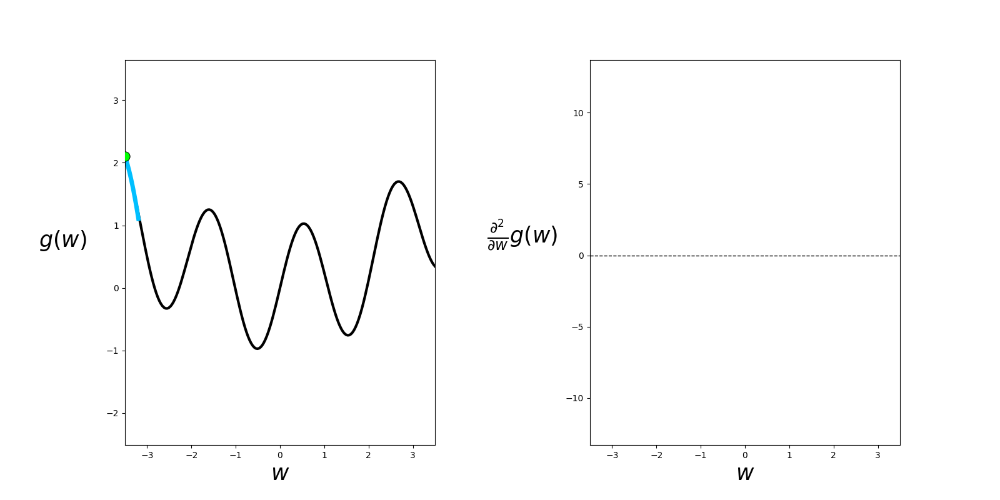
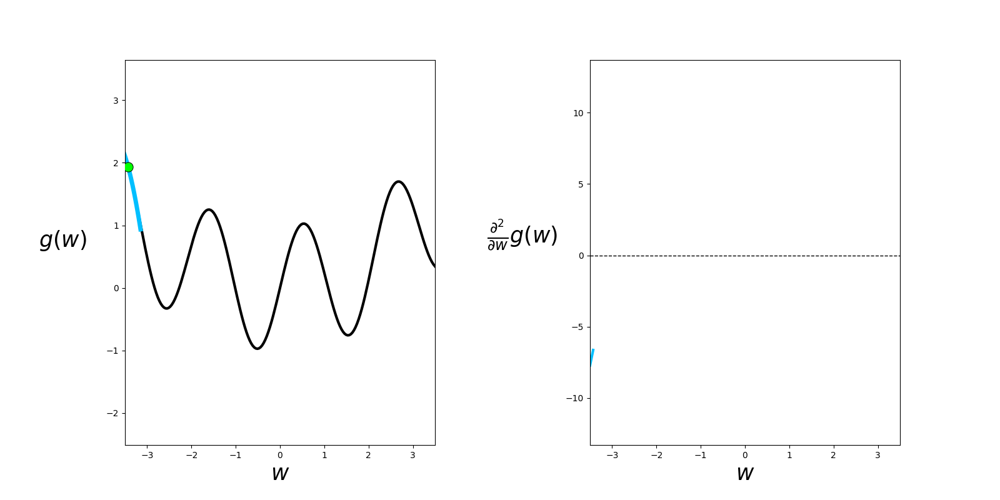
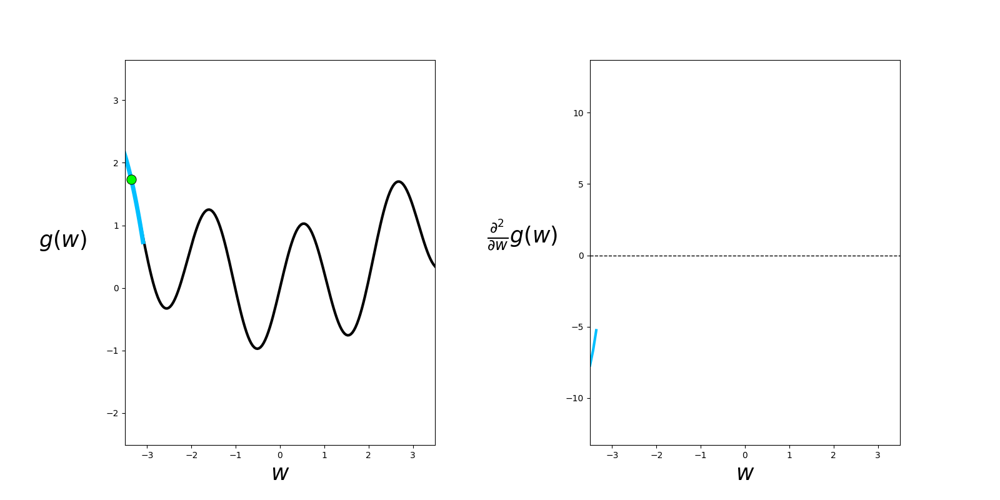
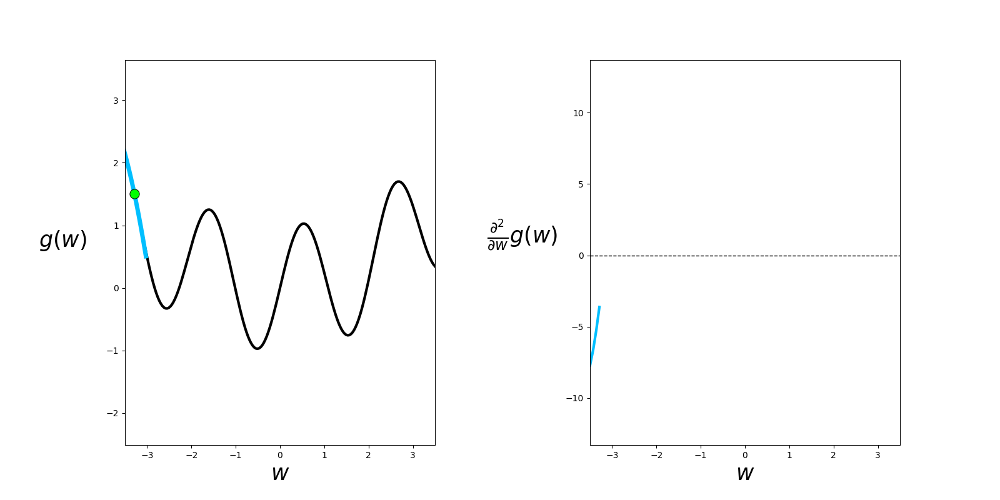
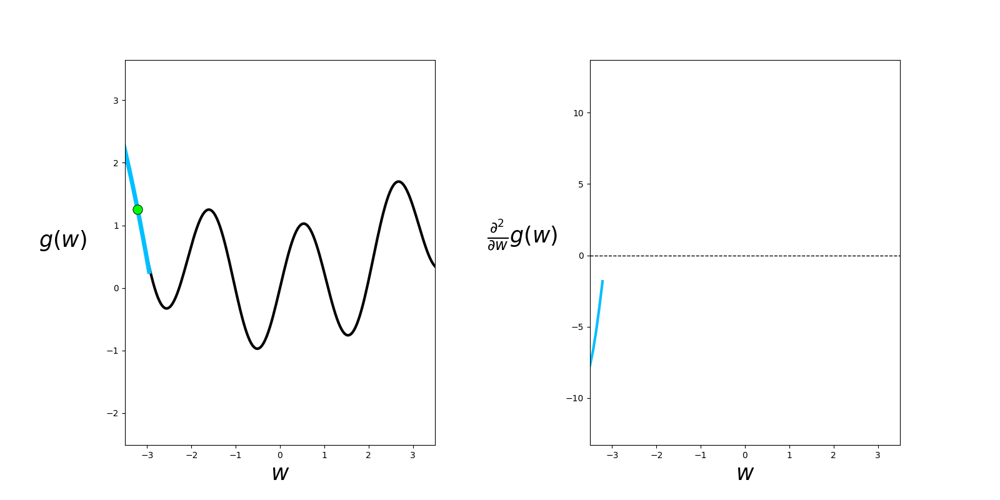
...
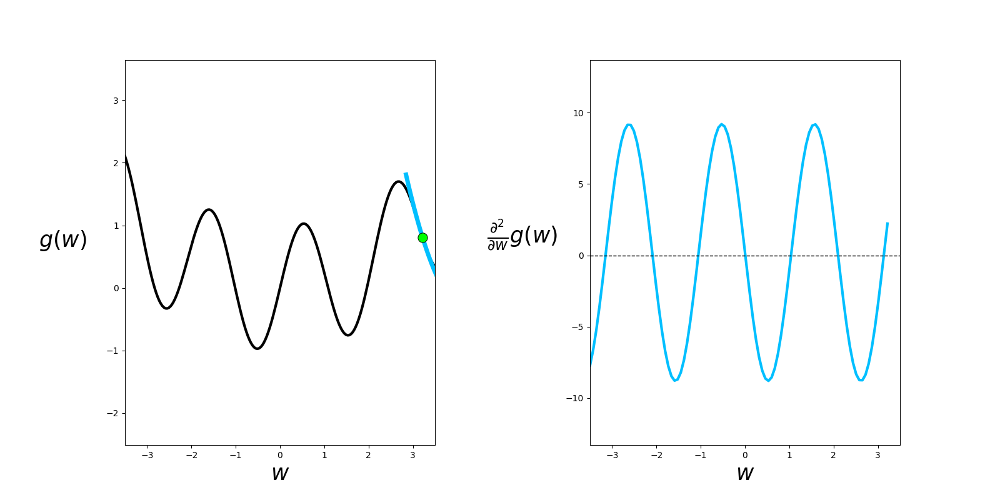
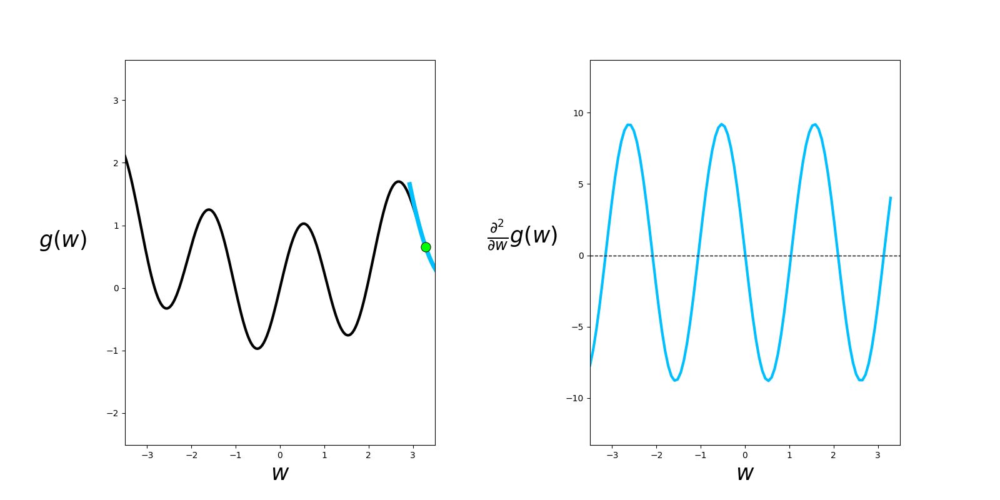
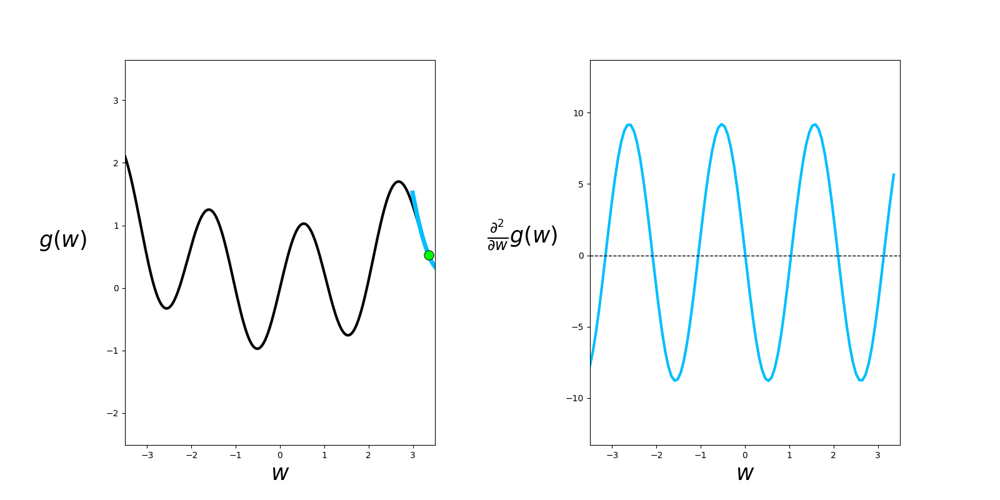
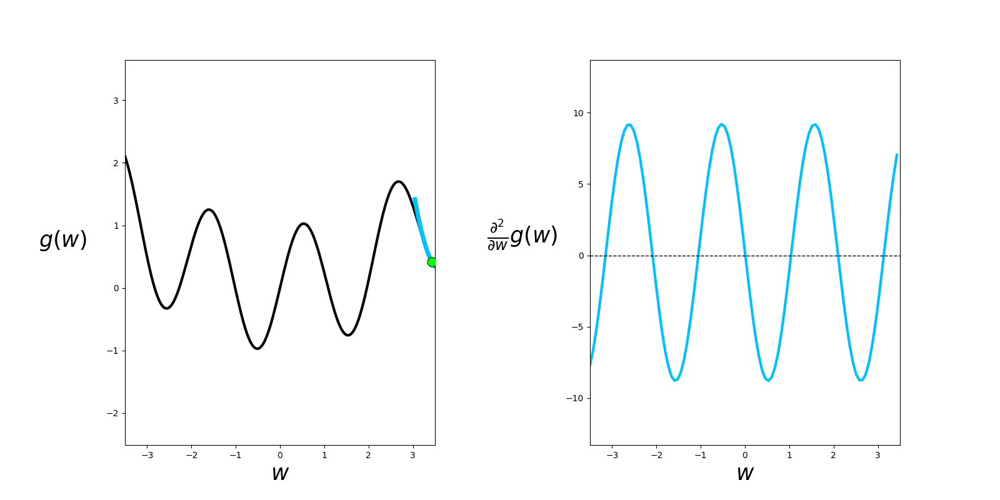
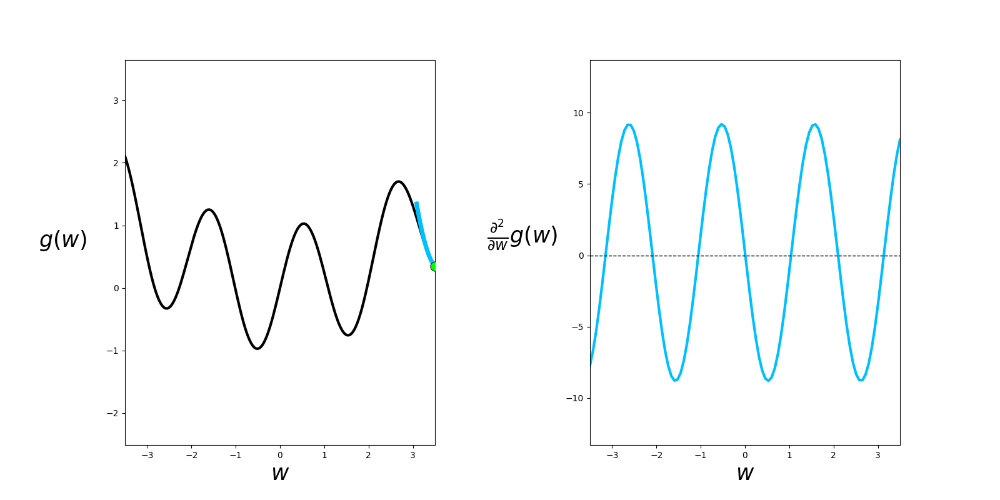

In [13]:
# what function should we play with?  Defined in the next line.
g = lambda w: np.sin(3*w) + 0.1*w**2

# create an instance of the visualizer with this function 
taylor_viz = callib.second_order_convexity.visualizer(g = g)

# run the visualizer for our chosen input function
taylor_viz.draw_it(num_frames = 100,max_val = 3.5)

One thing that can be seen in this simple example is that the second order approximation appears to match the local convexity/concavity of the underlying function near the point on which it is defined.  In other words, if at this point the function appears to be convex (facing upwards) locally, the second order approximation is too *convex* and upward facing.  If, on the other hand, the point is on a part of the function where it is facing downward or *concave*, the second order approximation is also concave and facing downward.  And the opposite holds as well - if the second order approximation is convex / concave, so too is the underlying function.

This is not a random coincidence.  Because the second order Taylor Series is a quadratic built to match a function locally this fact always holds - regardless of the type of function and whether it takes in a single input or multiple inputs.  Now, because quadratic functions are relatively simple objects (we in fact dedicated an entire post to detailing their characteristics) we can easily tell when a quadratic is convex or concave.  For a general single input quadratic

$$
g(w) = aw^2 + bw + c
$$

is convex if $a \geq 0$, and concave if $a \leq 0$ (technically if $a=0$ the function - being a line - is both convex and concave).  Given that the second order Taylor Series $h(w)$ of a single input function $g(w)$ at a point $w_0$ is given as 

$$
h(w) = g(w^0) + \frac{\mathrm{d}}{\mathrm{d}w}g(w^0)(w - w^0) +  \frac{1}{2}\frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w^0)(w - w^0)^2
$$

and since  $a = \frac{1}{2}\frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w^0)$ is the coeffecient of the squared term, it follows that the Taylor Series approximation is convex if $\frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w^0) \geq 0$ and concave if $\frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w^0) \leq 0$.

Since we have already established that a function $g(w)$ is convex / concave at a point $w_0$ if and only if its second order Taylor Series approximation is convex / concave there, this tells us that we can further say that $g(w)$ is convex at $w_0$ if and only if $\frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w^0) \geq 0$ or $\leq 0$ respectively.

> A function $g(w)$ is convex at $w_0$ if and only if $\frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w^0) \geq 0$.  Likewise it is concave if and only if $\frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w^0) \leq 0$.

Looking back at the example above we can see this is precisely what is going on in the right panel - where the value of the second derivative is plotted simultaneously along with the second order Taylor Series drawn in the left panel.  

It follows then that if a function $g$ is convex at each of its input points, it is convex overall (like a general single-input quadratic function is when $a \geq 0$).

> A function $g$ is convex if it is convex at each of its input points, or equivalently if $\frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w) \geq 0$ everywhere.  Likewise it is concave if $\frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w) \leq 0$ everywhere.

We can see this in any single-input example like the one plotted below

$$
g(w) = \frac{1}{50}\left(w^4 + w^2 + 10w\right)
$$

where once again the function itself as well as the second order Taylor Series approximation is drawn in the left panel, while the value of the second derivative is plotted simultaneously in the right panel.


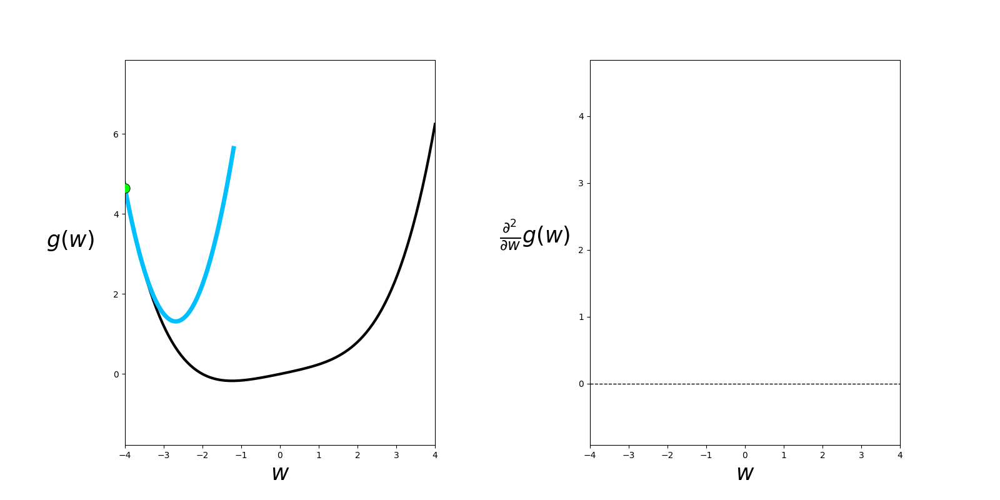
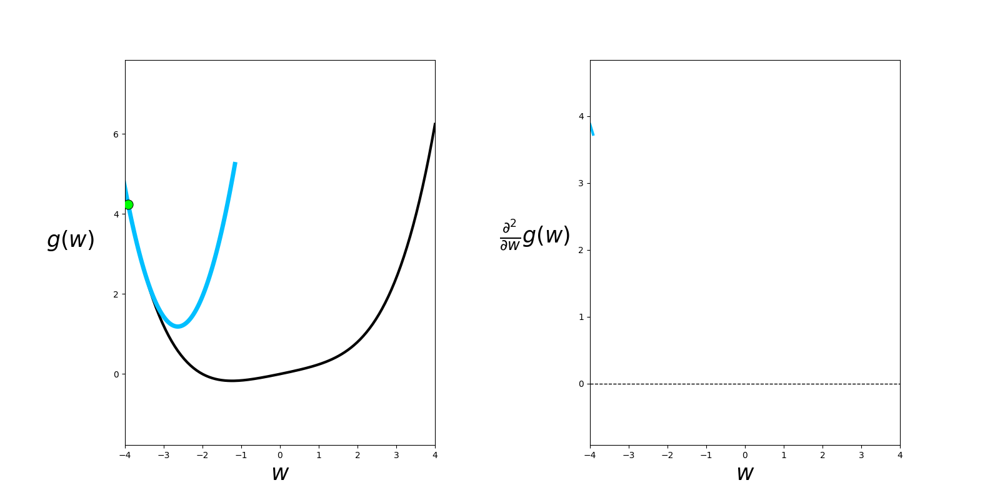
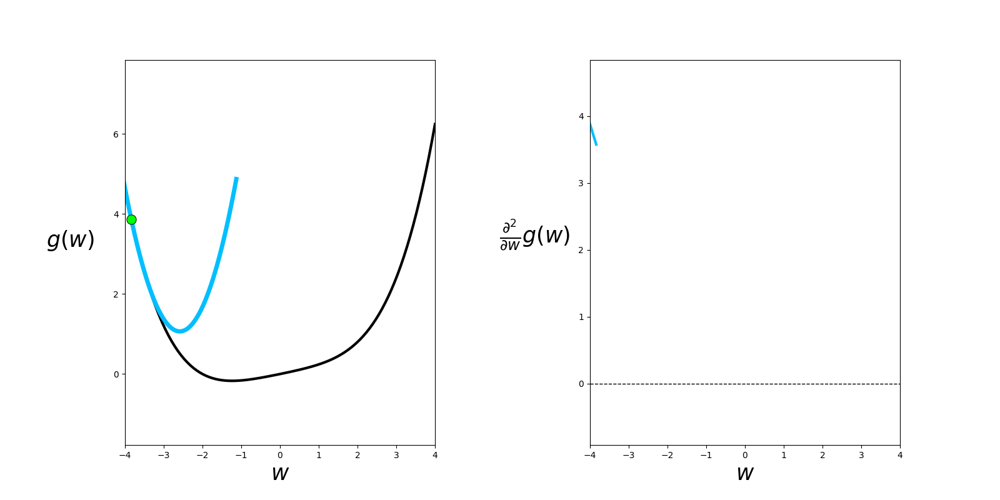
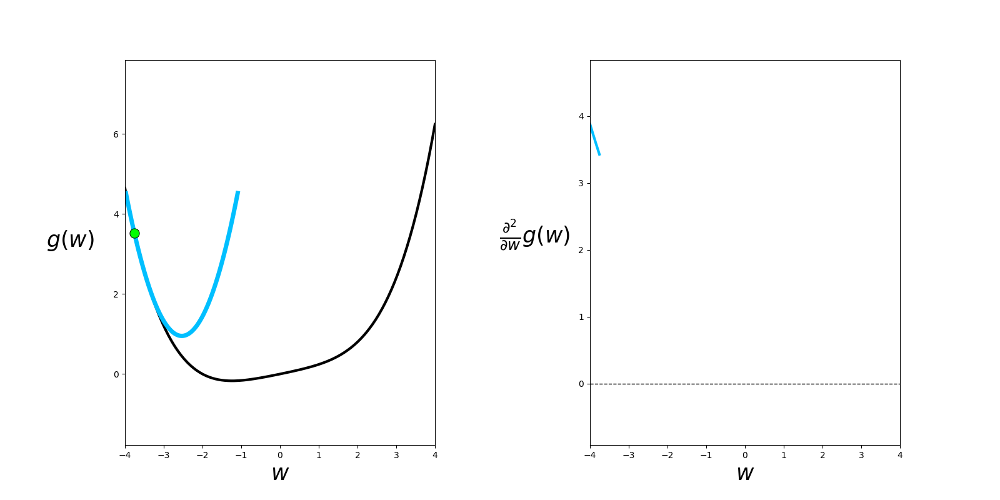
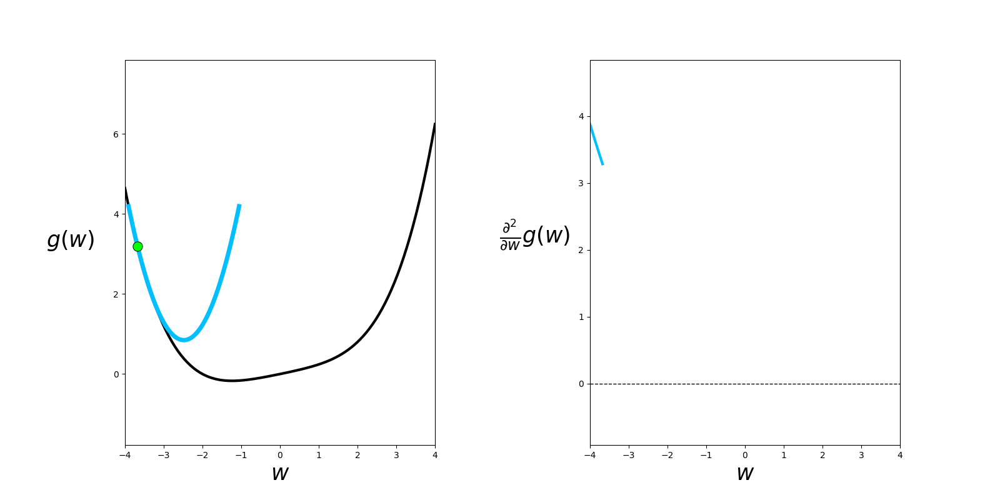
...
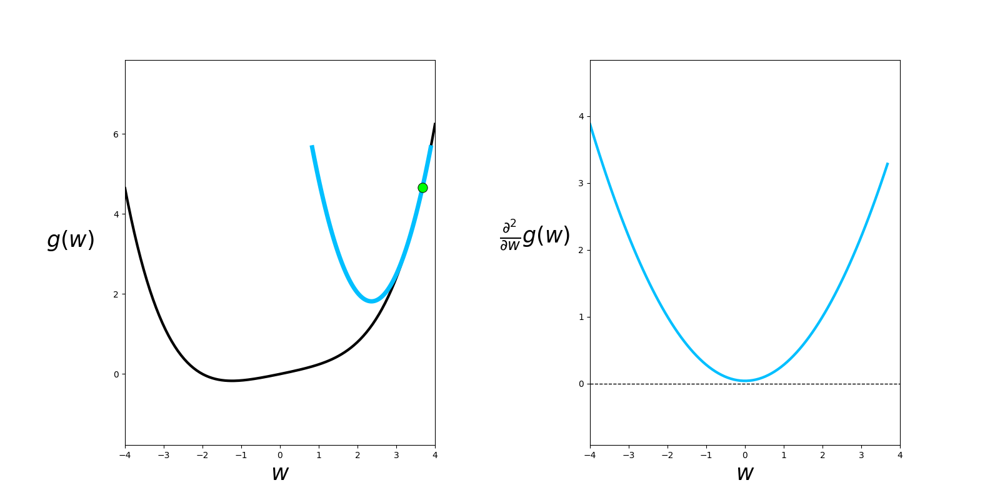
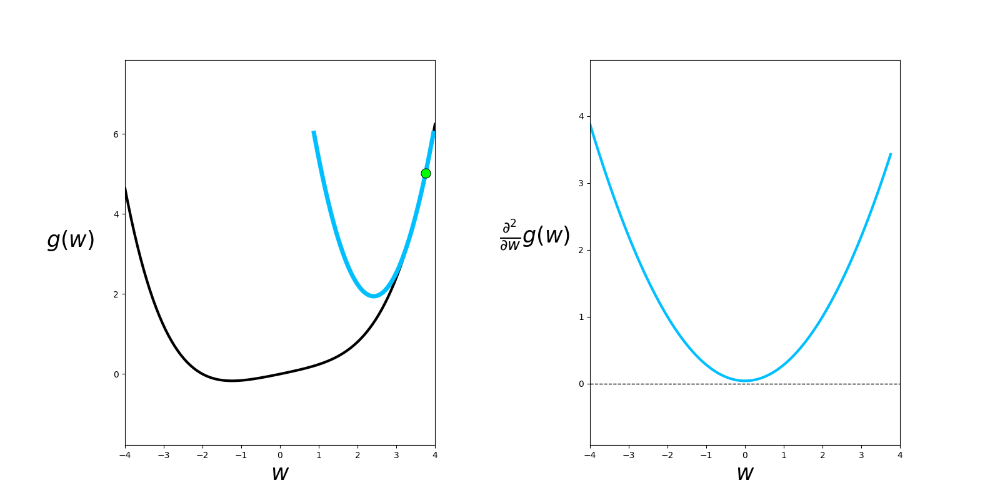
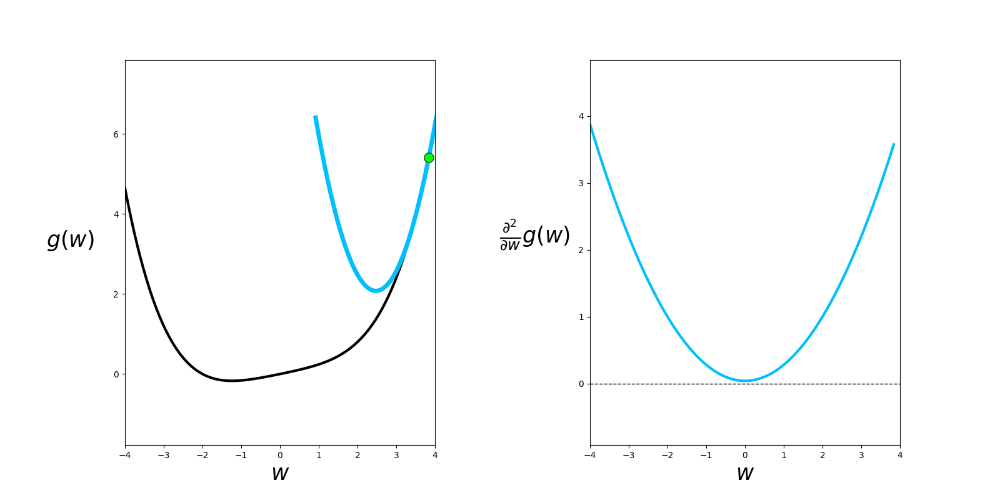
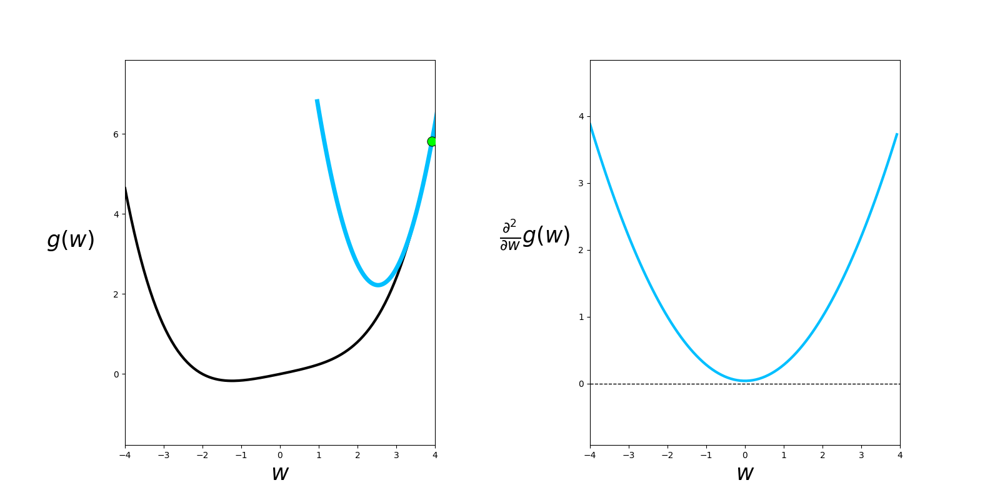
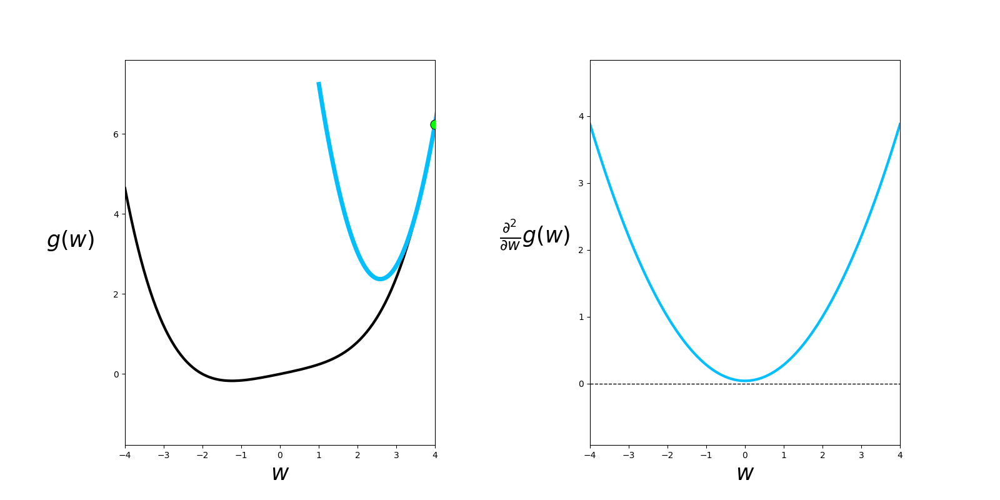

In [11]:
# what function should we play with?  Defined in the next line.
g = lambda w: 1/float(50)*(w**4 + w**2 + 10*w)

# create an instance of the visualizer with this function 
taylor_viz = callib.second_order_convexity.visualizer(g = g)

# run the visualizer for our chosen input function
taylor_viz.draw_it(num_frames = 100,max_val = 4)

#### <span style="color:#a50e3e;">Example </span> Hand calculations examples

Here are a few additional examples with second derivatives calculated algebraically.

- $g\left(w\right)=w^{3}$ has second derivative $\frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w)=6w$.  From the second derivative we see that $g$ is concave when $w\leq 0$ and convex when $w\geq 0$.


- $g\left(w\right)=e^{w}$ has second derivative $\frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w) = e^{w}$
which is positive for any choice of $w$, and so $g$ is convex everywhere and so is a convex function.


- $g\left(w\right)=\mbox{sin}\left(w\right)$ has second derivative
$\frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w)=-\mbox{sin}\left(w\right)$. This shows us that $g$ is convex when $\text{sin}(w) < 0$ and concave otherwise. 


- $g\left(w\right)=w^{2}$ has second derivative $\frac{\mathrm{d}^2}{\mathrm{d}w^2}g(w)=2$, which is always positie and so $g$ is convex everywhere, or in other words is a convex function.

## 1.2  Multi-input functions

The analagous rule for judging the convexity / concavity of a multi-input function via the convexity / concavity of its second order Taylor Series holds as well.  However as detailed in our post on quadratic functions, the convexity / concavity of a general multi-input quadratic function

$$
g(\mathbf{w}) = \mathbf{w}^T \mathbf{A}^{\,} \mathbf{w}^{\,} + \mathbf{b}^T \mathbf{w}^{\,} + c^{\,}
$$

is determined not by the value of the $N\times N$ symmetric matrix $\mathbf{A}$ but by its *eigenvalues*.  In particular the quadratic is convex along its $n^{th}$ input if and only if its $n^{th}$ eigenvalue $d_n \geq 0$, and conversely if concave $d_n \leq 0$.  Following, the quadratic is convex / concave in every input dimension if $d_n \geq 0$ or $d_n \leq 0$ respectively.  This reduces to the same condition on the single-input quadratic when $N=1$, see our post on quadratic functions for further details.

Given this condition on the convexity / concavity of a multi-input quadratic, in complete analogy to the case of a single-input function when it comes to the second order Taylor Series approximation of a multi-input function $g(\mathbf{w})$ at a point $\mathbf{w}^0$

$$
h(\mathbf{w}) = g(\mathbf{w}^0) + \nabla g(\mathbf{w}^0)^T(\mathbf{w} - \mathbf{w}^0) + \frac{1}{2}(\mathbf{w} - \mathbf{w}^0)^T \nabla^2 g\left(\mathbf{w}^0\right) (\mathbf{w} - \mathbf{w}^0)
$$

it is the eigenvalues of the Hessian matrix $\mathbf{A} = \nabla^2 g\left(\mathbf{w}^0\right)$ that determine the convexity of the approximation, and hence of the underlying function at $\mathbf{w}^0$.  More specifically $g$ is convex at $\mathbf{w}^0$ if and only if the approximation is convex in every one of its input dimension, or in other words if $ \nabla^2 g\left(\mathbf{w}^0\right)$ has all nonnegative eigenvalues (such a matrix is called *positive semi-definite*).  Likewise $g(\mathbf{w}^0)$ is concave if $ \nabla^2 g\left(\mathbf{w}^0\right)$ has all nonpositive eigenvalues.

> $g$ is convex at $\mathbf{w}^0$ if and only if the second order Taylor Series approximation is convex in every one of its input dimension, or in other words if $ \nabla^2 g\left(\mathbf{w}^0\right)$ has all nonnegative eigenvalues.  Likewise $g(\mathbf{w}^0)$ is concave if $ \nabla^2 g\left(\mathbf{w}^0\right)$ has all nonpositive eigenvalues.

Furthermore a function $g$ is a *convex function* if it is convex everywhere, or if $ \nabla^2 g\left(\mathbf{w}\right)$ has all nonnegative eigenvalues at every input $\mathbf{w}$.  Conversely it is a concave function if $ \nabla^2 g\left(\mathbf{w}\right)$ has all nonpositive eigenvalues everywhere.

> Furthermore a function $g$ is a *convex function* if it is convex everywhere, or if $ \nabla^2 g\left(\mathbf{w}\right)$ has all nonnegative eigenvalues at every input $\mathbf{w}$.  Conversely it is a concave function if $ \nabla^2 g\left(\mathbf{w}\right)$ has all nonpositive eigenvalues everywhere.